In [45]:
# -------------------------
# Standard Library Imports
# -------------------------
import copy, gc, glob, json, multiprocessing, os, random, re, shutil, sys, time, warnings, logging
from importlib import reload
from pprint import pprint

# -------------------------
# Scientific Libraries
# -------------------------
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon, Rectangle
import numpy as np
from PIL import Image
from scipy import interpolate
from numpyencoder import NumpyEncoder
import torch
import torchvision

# -------------------------
# Astropy and Astroquery
# -------------------------
import astropy.constants as const
import astropy.units as u
from astropy import table
from astropy.convolution import Box1DKernel, convolve
from astropy.coordinates import SkyCoord, concatenate
from astropy.io import fits, ascii
from astropy.modeling import functional_models, models
from astropy.stats import sigma_clipped_stats, SigmaClip
from astropy.table import Table
from astropy.visualization.wcsaxes import WCSAxes
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales
from astropy.wcs import FITSFixedWarning
from astroquery.sdss import SDSS

# -------------------------
# Detectron2
# -------------------------
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultPredictor, DefaultTrainer, SimpleTrainer
from detectron2.modeling import *
from detectron2.solver import *
from detectron2.utils import comm
from detectron2.utils.visualizer import Visualizer

# -------------------------
# Plotting Style
# -------------------------
import scienceplots
plt.style.use(['bright', 'science', 'no-latex', 'notebook'])
plt.rcParams['image.origin'] = 'upper'
plt.rcParams["figure.figsize"] = (15, 10)

# -------------------------
# Suppress Astropy Warnings
# -------------------------
warnings.simplefilter('ignore', FITSFixedWarning)

# -------------------------
# Jupyter Display Settings
# -------------------------
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


utility functions

In [46]:
# Set up the logger
LOG = logging.getLogger(__name__)
LOG.setLevel(logging.INFO)

# Add a basic console handler (only once!)
if not LOG.handlers:
    handler = logging.StreamHandler()
    formatter = logging.Formatter('%(levelname)s - %(message)s')
    handler.setFormatter(formatter)
    LOG.addHandler(handler)

In [47]:
def log_call(func):
    def wrapper(*args, **kwargs):
        # print(f'Calling "{func.__name__}"')
        LOG.info(f'Calling "{func.__name__}"')
        return func(*args, **kwargs)
    return wrapper

# Usage: @log_call ...

In [48]:
import utils, grism

## Use EDR images as input

In [49]:
# NOTE: upper case is used for global and permanent variables, which may be used 
# by functions below
GRISM_DIR = '/data/sapphires/grism/'
PNG_DIR = '/home/yichenliu/machine-learning-demo/png'
os.makedirs(PNG_DIR, exist_ok=True)

In [50]:
with fits.open('sapphires_edr_phot_cat.fits') as hdu:
    hdu.info()
    TBL_PHOT = Table(hdu['PHOT'].data)

with fits.open('sapphires_edr_spec_cat.fits') as hdu:
    hdu.info()
    TBL_SPEC = Table(hdu['ZSPEC'].data)

ALL_LINES_USED = list(set(
    name 
    for names in TBL_SPEC['name']
    for name in names.split('|')
))

Filename: sapphires_edr_phot_cat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  PHOT          1 BinTableHDU    640   22107R x 299C   [J, D, D, D, D, K, K, K, K, D, D, D, D, D, D, D, D, D, D, D, E, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D

Filename: sapphires_edr_spec_cat.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  ZSPEC         1 BinTableHDU     53   1060R x 8C   [K, D, D, D, K, 53A, 47A, K]   
  2  SED           1 BinTableHDU     89   1060R x 17C   [K, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D]   


In [51]:
# Filter out EDR data
grism_paths = glob.glob(os.path.join(GRISM_DIR, 'jw064341[1-3]*nrc[a-b]long_rate_lv1.5.fits'))

# NOTE: temporarily use 4750 as the path. Verification needed.
image_path = '/data/sapphires/all_mosaics/4750/4750_F444W_v05_i2d.fits'
grism_path = grism_paths[0]
image_id = 1


All the external files needed should have been collected above this point. 

## Start making training images and labels.

In [52]:
@log_call
def get_data(image_path, grism_path):

    this_primary_head = fits.getheader(grism_path, 0)
    this_filter = this_primary_head['FILTER']
    this_module = this_primary_head['MODULE']
    this_pupil = this_primary_head['PUPIL'][-1]

    with fits.open(grism_path) as hdu:
        # hdu.info()
        grism_data = hdu['SCI'].data
        grism_emline = hdu['EMLINE'].data
        grism_wcs = WCS(hdu['SCI'].header)

    reprojected_data = utils.get_sci_cutout_with_matching_wcs(image_path, grism_wcs)

    grism_data[np.isnan(grism_data)] = 0
    grism_emline[np.isnan(grism_emline)] = 0
    reprojected_data[np.isnan(reprojected_data)] = 0

    return grism_data, grism_emline, grism_wcs, reprojected_data, \
           this_filter, this_module, this_pupil

grism_data, grism_emline, grism_wcs, reprojected_data, this_filter, this_module, this_pupil = get_data(image_path, grism_path)

INFO - Calling "get_data"


In [53]:
@log_call
def save_input_png(grism_path, grism_data, grism_emline, reprojected_data):

    _, _, std = sigma_clipped_stats(reprojected_data)
    _, _, std_data = sigma_clipped_stats(grism_data)
    _, _, std_emline = sigma_clipped_stats(grism_emline)


    im = np.array([
        utils.normalize_to_95_percent_range(np.arcsinh(reprojected_data/std)),
        utils.normalize_to_95_percent_range(np.arcsinh(grism_emline/std_emline)), 
        utils.normalize_to_95_percent_range(np.arcsinh(grism_data/std_data)),
        # utils.normalize_to_95_percent_range(np.arcsinh(reprojected_data/std)),
        # utils.normalize_to_95_percent_range(np.arcsinh(reprojected_data/std)),
    ]).transpose(1, 2, 0)

    grism_name = os.path.basename(grism_path)
    save_path = os.path.join(PNG_DIR, f'{grism_name[:-5]}.png')
    cv2.imwrite(save_path, (im*255)[...,::-1].astype(np.uint8))
    
    LOG.info(f'png saved to {save_path}')

    return im

im = save_input_png(grism_path, grism_data, grism_emline, reprojected_data)

INFO - Calling "save_input_png"
INFO - png saved to /home/yichenliu/machine-learning-demo/png/jw06434122001_05201_00002_nrcblong_rate_lv1.5.png


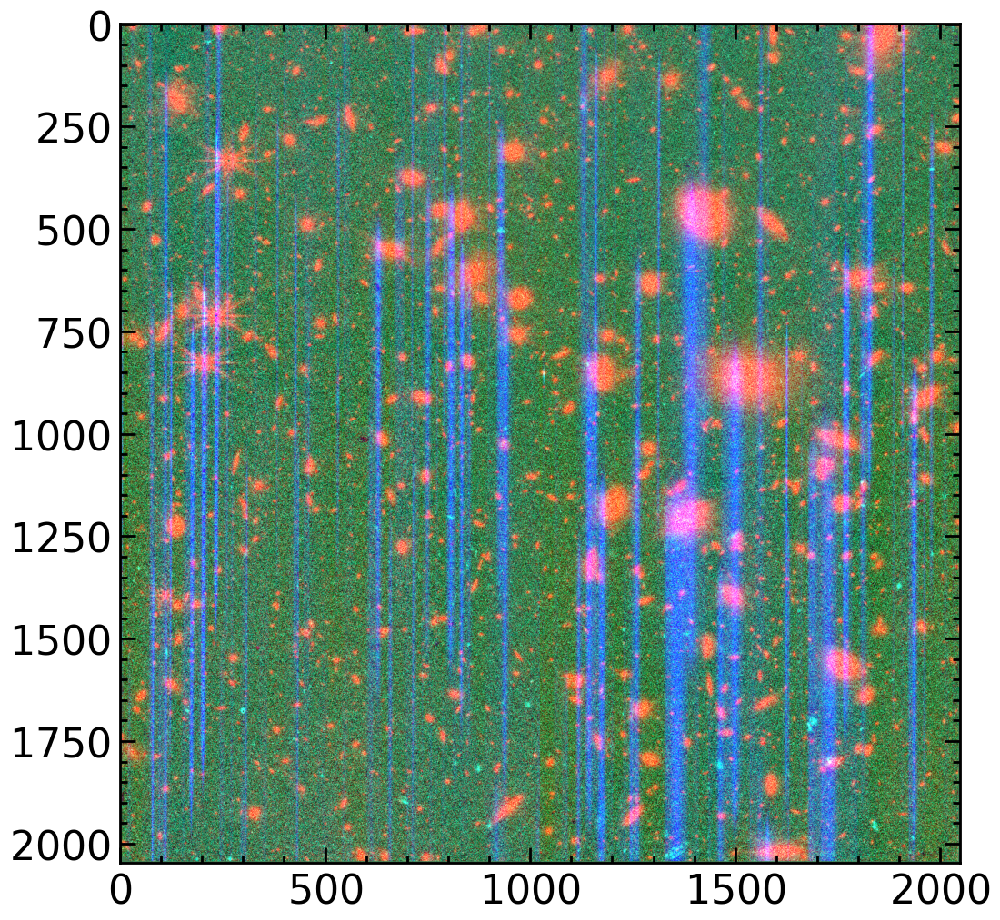

In [54]:
plt.figure(figsize=[6, 6])

plt.imshow(im)

plt.show()

### try to generate some labels

Select sources

In [55]:
@log_call
def select_source(this_filter, grism_wcs):

    coords_phot = SkyCoord(TBL_PHOT['RA']*u.deg, TBL_PHOT['DEC']*u.deg)
    sel_pos = grism_wcs.footprint_contains(coords_phot)
    sel_spec = np.isin(TBL_PHOT['ID'], TBL_SPEC['ID'])
    sel_flux = TBL_PHOT[f'{this_filter.upper()}_CIRC1']>10
    # print(np.count_nonzero(sel_pos), 
    #     np.count_nonzero(sel_spec), 
    #     np.count_nonzero(sel_flux))

    # NOTE: use "or" logic here because we want to include it either the photometry 
    # or the emission line is included in the image
    # tbl_phot_sel = TBL_PHOT[sel_pos|sel_spec]
    tbl_phot_sel = TBL_PHOT[(sel_pos&sel_flux)|sel_spec]

    # NOTE: use only sources with confirmed emlission lines
    # tbl_phot_sel = TBL_PHOT[sel_spec]

    LOG.info(f'{len(tbl_phot_sel)} sources in this image')

    return tbl_phot_sel

@log_call
def create_label_table(tbl_phot_sel):

    tbl_label = Table(tbl_phot_sel[['ID', 'RA', 'DEC']])
    tbl_label['has_spec'] = np.isin(tbl_label['ID'], TBL_SPEC['ID'])

    return tbl_label

tbl_phot_sel = select_source(this_filter, grism_wcs)
tbl_label = create_label_table(tbl_phot_sel)

INFO - Calling "select_source"
INFO - 3360 sources in this image
INFO - Calling "create_label_table"


### Photometry polygon

In [56]:
@log_call
def add_polygon_to_label_(tbl_phot_sel, tbl_label):
    '''
    XXX: In-place operation
    '''

    x_poly_list = []
    y_poly_list = []
    has_poly_list = []
    for i in range(len(tbl_label)):

        ra = tbl_label[i]['RA']*u.deg
        dec = tbl_label[i]['DEC']*u.deg
        
        sigma_ratio = 3
        a_pix = tbl_phot_sel[i]['semimajor_sigma']*sigma_ratio   # semimajor axis in pixels
        b_pix = tbl_phot_sel[i]['semiminor_sigma']*sigma_ratio  # semiminor axis in pixels
        theta_deg = -tbl_phot_sel[i]['orientation'] * u.deg  # angle from RA axis counterclockwise

        if grism_wcs.footprint_contains(SkyCoord(ra, dec)):
            x_poly, y_poly = utils.calc_elliptical_source_polygon(
                grism_wcs, ra, dec, a_pix, b_pix, theta_deg
            )
            x_poly_list.append(x_poly)
            y_poly_list.append(y_poly)
            has_poly_list.append(True)

        else: 
            x_poly_list.append(None)
            y_poly_list.append(None)
            has_poly_list.append(False)

    tbl_label['x_poly'] = x_poly_list
    tbl_label['y_poly'] = y_poly_list
    tbl_label['has_poly'] = has_poly_list

add_polygon_to_label_(tbl_phot_sel, tbl_label)

INFO - Calling "add_polygon_to_label_"


show image source

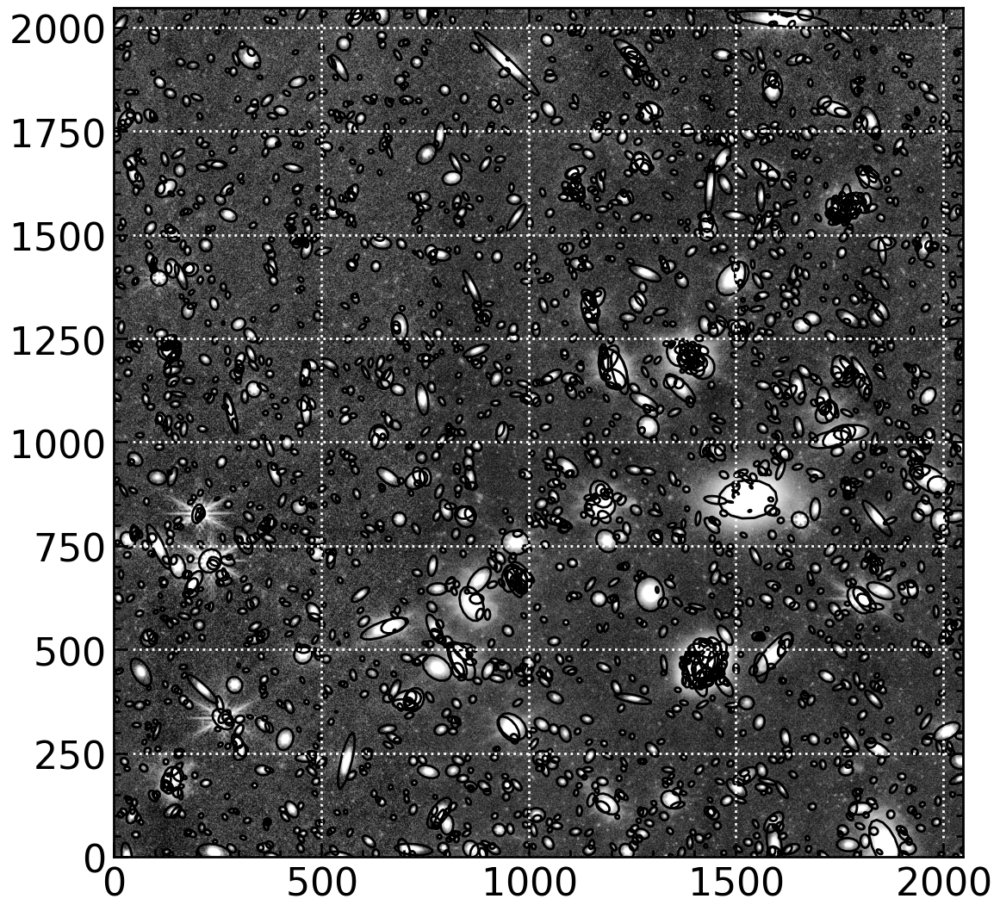

In [57]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111)#, projection=grism_wcs)

_, _, std = sigma_clipped_stats(reprojected_data)
_, _, std_data = sigma_clipped_stats(grism_data)
_, _, std_emline = sigma_clipped_stats(grism_emline)

for i in range(len(tbl_label)):

    x_poly = tbl_label['x_poly'][i]
    y_poly = tbl_label['y_poly'][i]

    if x_poly is not None:
        ax.add_patch(Polygon(np.column_stack([x_poly, y_poly]), closed=True,
                            edgecolor='k', facecolor='none', lw=1))


# reprojected_data = get_sci_cutout_with_matching_wcs(image_path, grism_wcs)
# ax.imshow(data, origin='lower', cmap='gray', vmin=0, vmax=0.01)
ax.imshow(utils.normalize_to_95_percent_range(np.arcsinh(reprojected_data/std)), 
          origin='lower', cmap='gray')
# ax.imshow(im, origin='lower', cmap='gray', vmin=0, vmax=0.01)

# ax.set_xlabel('RA')
# ax.set_ylabel('Dec')
ax.set_aspect('equal')
ax.grid(color='white', ls='dotted')
plt.tight_layout()
plt.show()

### Emission lines

In [58]:
@log_call
def add_lines_to_label_(WRANGE, this_spatial_model, this_disp_model, tbl_label):

    list_line_names = []
    list_xlines = []
    list_ylines = []

    for row in tbl_label:

        if row['has_spec']:
            coord = SkyCoord(row['RA']*u.deg, row['DEC']*u.deg)
            pixelx, pixely = grism_wcs.world_to_pixel(coord)

            idx_spec = np.where(row['ID'] == TBL_SPEC['ID'])[0][0]
            names = TBL_SPEC['name'][idx_spec].split('|')
            waves = list(map(float, TBL_SPEC['wave'][idx_spec].split('|')))

            # Process each line
            xlines, ylines = grism.find_pixel_location(
                WRANGE, this_spatial_model, this_disp_model, this_pupil,
                pixelx, pixely, waves
            )
            
            # Filter lines inside image frame
            lines_in_frame = [(name, x, y)
                            for name, x, y in zip(names, xlines, ylines)
                            if 0 < x < 2048 and 0 < y < 2048]

            if lines_in_frame:
                names_exist, xlines, ylines = zip(*lines_in_frame)
                list_line_names.append(list(names_exist))
                list_xlines.append(list(xlines))
                list_ylines.append(list(ylines))
            else:
                list_line_names.append(None)
                list_xlines.append(None)
                list_ylines.append(None)

        else:
            list_line_names.append(None)
            list_xlines.append(None)
            list_ylines.append(None)

    # Add columns to table
    tbl_label['line_names'] = list_line_names
    tbl_label['xlines'] = list_xlines
    tbl_label['ylines'] = list_ylines


WRANGE, this_spatial_model, this_disp_model = grism.load_nircam_wfss_model(pupil=this_pupil, module=this_module, filter=this_filter)
add_lines_to_label_(WRANGE, this_spatial_model, this_disp_model, tbl_label)

INFO - Calling "add_lines_to_label_"


filter out out-of-frame objects (mainly spectra)

In [59]:
@log_call
def filter_out_labels(tbl_label):

    mask_keep = [any(row[k] is not None for k in ['x_poly', 'xlines', 'ylines']) 
                for row in tbl_label]
    tbl_label_filtered = tbl_label[mask_keep]
    tbl_label_filtered['has_spec'] = [lines is not None 
                                    for lines in tbl_label_filtered['line_names']]

    return tbl_label_filtered

tbl_label_filtered = filter_out_labels(tbl_label)

INFO - Calling "filter_out_labels"


plot to visually check

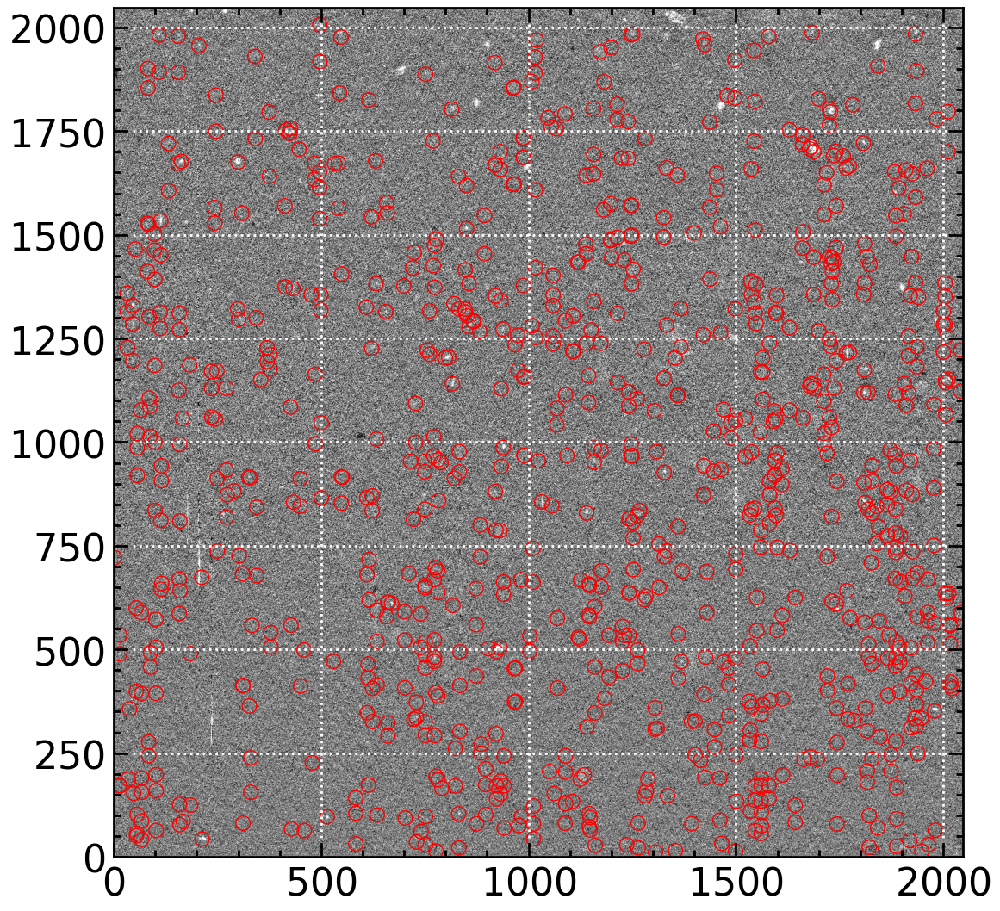

In [60]:
fig = plt.figure(figsize=(6, 6))
# ax = fig.add_subplot(111, projection=grism_wcs)
ax = fig.add_subplot(111)

    
flat_x = np.concatenate([x for x in tbl_label_filtered['xlines'] if x is not None])
flat_y = np.concatenate([y for y in tbl_label_filtered['ylines'] if y is not None])
plt.scatter(flat_x, flat_y, marker='o', c='none', edgecolors='r', linewidths=0.5)

# reprojected_data = get_sci_cutout_with_matching_wcs(image_path, grism_wcs)
# ax.imshow(data, origin='lower', cmap='gray', vmin=0, vmax=0.01)
ax.imshow(utils.normalize_to_95_percent_range(np.arcsinh(grism_emline/std_emline)), 
          origin='lower', cmap='gray')
# ax.imshow(im, origin='lower', cmap='gray', vmin=0, vmax=0.01)

# ax.set_xlabel('RA')
# ax.set_ylabel('Dec')
ax.set_aspect('equal')
ax.grid(color='white', ls='dotted')
plt.tight_layout()
plt.show()

### bbox for continuum

In [61]:
@log_call
def add_bbox_to_label_(tbl_label_filtered):

    bboxes = []
    for row in tbl_label_filtered:

        # coord = SkyCoord(row['RA']*u.deg, row['DEC']*u.deg)
        x_poly = row['x_poly']
        y_poly = row['y_poly']

        if x_poly is not None: 
            xvals = []
            yvals = []
            for pixelx, pixely in [[min(x_poly), min(y_poly)], [max(x_poly), max(y_poly)]]:

                xlines, ylines = grism.find_pixel_location(
                    WRANGE, this_spatial_model, this_disp_model, this_pupil,
                    pixelx, pixely, WRANGE
                )
                for x in xlines: xvals.append(x)
                for y in ylines: yvals.append(y)
            xmin = max(min(xvals), 0)
            ymin = max(min(yvals), 0)
            xmax = min(max(xvals), 2048)
            ymax = min(max(yvals), 2048)

        else: 
            coord = SkyCoord(row['RA']*u.deg, row['DEC']*u.deg)
            pixelx, pixely = grism_wcs.world_to_pixel(coord)
            xvals, yvals = grism.find_pixel_location(
                WRANGE, this_spatial_model, this_disp_model, this_pupil,
                pixelx, pixely, WRANGE
            )
            xmin = max(min(xvals), 0)
            ymin = max(min(yvals), 0)
            xmax = min(max(xvals), 2048)
            ymax = min(max(yvals), 2048)

        bbox = [xmin, ymin, xmax - xmin, ymax-ymin]

        bboxes.append(bbox)

    tbl_label_filtered['bbox'] = bboxes

add_bbox_to_label_(tbl_label_filtered)

INFO - Calling "add_bbox_to_label_"


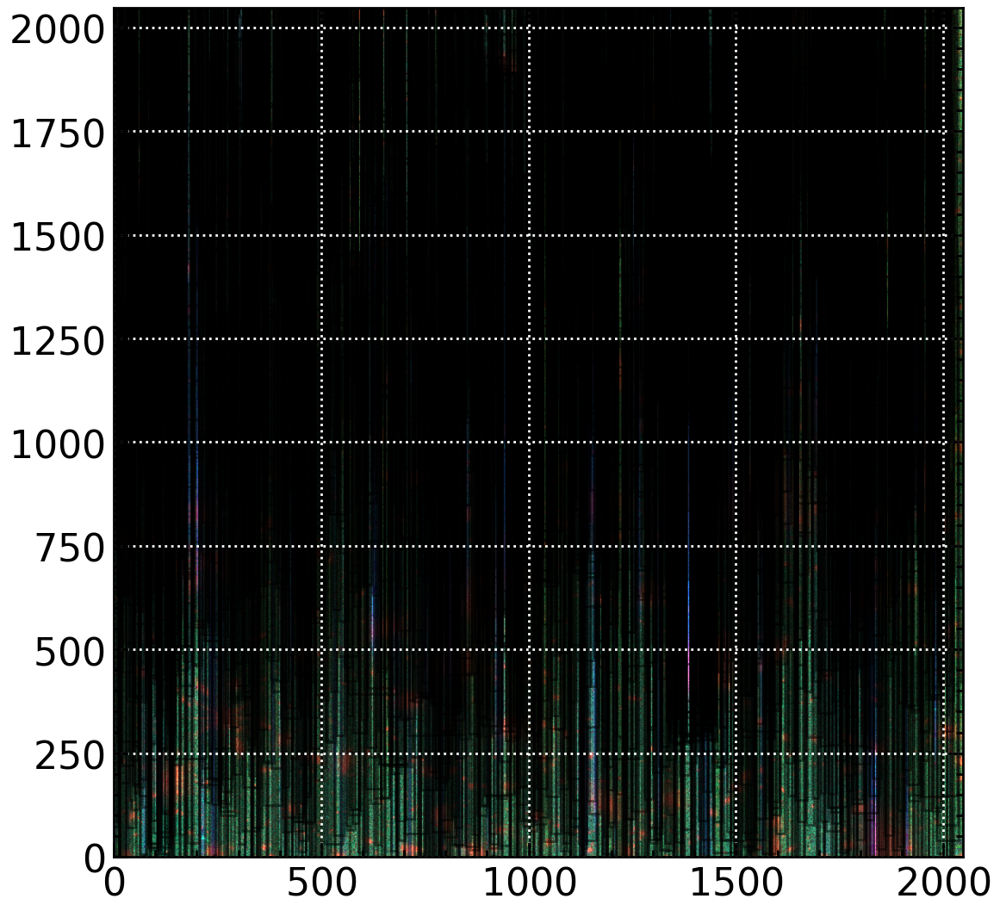

In [64]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111)#, projection=grism_wcs)

for bbox in tbl_label_filtered['bbox']:
    xmin, ymin, width, height = bbox
    rect = Rectangle((xmin, ymin), width, height, facecolor='none', 
                     edgecolor='k', alpha=0.5, linewidth=1)
    ax.add_patch(rect)

# reprojected_data = get_sci_cutout_with_matching_wcs(image_path, grism_wcs)
# ax.imshow(data, origin='lower', cmap='gray', vmin=0, vmax=0.01)
# ax.imshow(utils.normalize_to_95_percent_range(np.arcsinh(grism_data/grism_data)), 
        #   origin='lower', cmap='gray')
ax.imshow(im, origin='lower', cmap='gray', vmin=0, vmax=0.01)

# ax.set_xlabel('RA')
# ax.set_ylabel('Dec')
ax.set_aspect('equal')
ax.grid(color='white', ls='dotted')
plt.tight_layout()
plt.show()

### Finalize labels

In [66]:
@log_call
def create_label_json():

    label = {
        'info': {
            'description': 'SAPPHIRES EDR Slitless Spectra',
            'url': 'https://yliu.fit',
            'version': '0.1',
            'year': 2025,
            'contributor': 'Yichen Liu',
            'date_created': '2025/04/04'
        },
        'licenses': {
            'url': 'NaN',
            'id': 1,
            'name': 'NaN'
        },
        'images': [], # NotImplemented
        'annotations': [], # NotImplemented
        'categories': [], # NotImplemented
    }

    # categories

    label['categories'].append(
        {
            'id': 1,                   # Category ID
            'name': 'source',# Category name
            'supercategory': 'astronomy',      # (Optional) super-category grouping
            'keypoints': ALL_LINES_USED, # Keypoint names (emission lines)
            'skeleton': []            # No skeleton connections (not applicable for lines)
        }
    )

    return label

@log_call
def add_image_to_label_json_(label, tbl_label_filtered, grism_path, image_id):

    
    grism_name = os.path.basename(grism_path)

    # images

    label['images'].append(
        {
        'id': image_id,                   # Image ID
        'width': 2048,             # Image width in pixels
        'height': 2048,            # Image height in pixels
        'file_name': os.path.join(PNG_DIR, f'{grism_name[:-5]}.png') # Image file name
        }
    )

    # labels

    for row in tbl_label_filtered:

        annotation = {
            'image_id': image_id,
            'id': image_id*100000 + row['ID'], # Annotation ID must be unique
            'category_id': 1,  # References the 'source' category
            'bbox': row['bbox'], # [x_min, y_min, width, height]
            'iscrowd': False, # 0 = single object (not a crowd)
        }
        
        if row['has_poly']:
            x_poly = row['x_poly']
            y_poly = row['y_poly']
            poly = [coord for pair in zip(x_poly, y_poly) for coord in pair]
            annotation['segmentation'] = [poly]
        else:
            annotation['segmentation'] = []

        if row['has_spec']: 
            line_names = row['line_names']
            xlines = row['xlines']
            ylines = row['ylines']
            line_dict = {name: (x, y) for name, x, y in zip(line_names, xlines, ylines)}
            # Construct full keypoints list
            keypoints = []
            for name in ALL_LINES_USED:
                if name in line_dict:
                    x, y = line_dict[name]
                    keypoints += [x, y, 2]  # visible
                else:
                    keypoints += [0, 0, 0]  # not labeled or not visible
            annotation['keypoints'] = keypoints
            annotation['num_keypoints'] = len(line_names)
        else: 
            annotation['keypoints'] = [0]*(len(ALL_LINES_USED)*3)
            annotation['num_keypoints'] = 0

        label['annotations'].append(annotation)

label = create_label_json()
add_image_to_label_json_(label, tbl_label_filtered, grism_path, image_id)

INFO - Calling "create_label_json"
INFO - Calling "add_image_to_label_json_"


In [67]:
with open(os.path.join('label.json'), 'w') as f:
    json.dump(label, f, sort_keys=False, indent=2, separators=(',', ': '), cls=NumpyEncoder)

## see if we can show it using detectron2

In [68]:
try: 
    DatasetCatalog.remove('slitless_spectra')
    MetadataCatalog.remove('slitless_spectra')
except:
    pass

In [69]:
register_coco_instances('slitless_spectra', {}, 'label.json', '.')

/home/yichenliu/machine-learning-demo/png/jw06434122001_05201_00002_nrcblong_rate_lv1.5.png


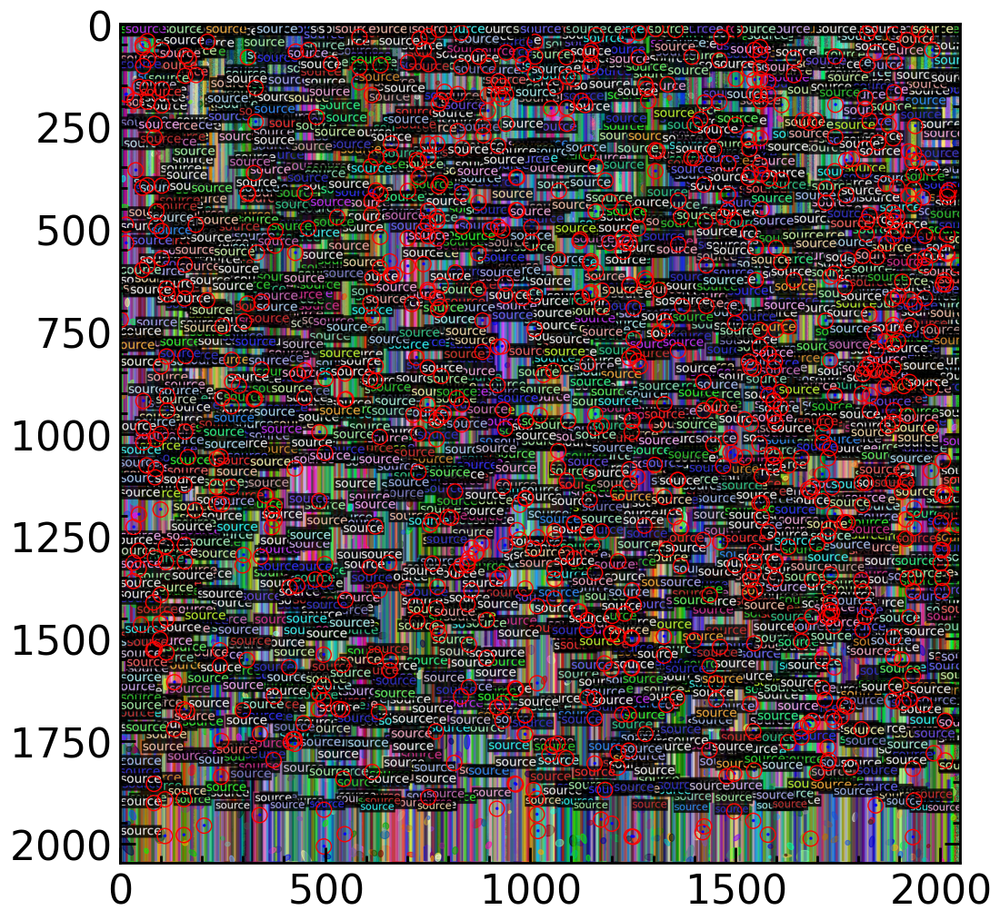

In [70]:
dataset_dicts = DatasetCatalog.get('slitless_spectra')
metadata = MetadataCatalog.get('slitless_spectra')

plt.figure(figsize=[6, 6])

for d in random.sample(dataset_dicts, 1):
    for a in d['annotations']:
        a.setdefault('segmentation', [])  # adds empty list if missing
    img = cv2.imread(d["file_name"])
    # print(img.shape)
    visualizer = Visualizer(img, metadata=metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    print(d["file_name"])
    plt.imshow(out.get_image()[:,:,::-1], origin='upper')

    # additionally check if the emission lines are aligned
    
    flat_x = np.concatenate([x for x in tbl_label_filtered['xlines'] if x is not None])
    flat_y = np.concatenate([y for y in tbl_label_filtered['ylines'] if y is not None])
    plt.scatter(flat_x, flat_y, marker='o', c='none', edgecolors='r', linewidths=0.5)

len(dataset_dicts)

plt.show()

## Okay, now we repeat all of them in different images

Select F444W + R images

In [25]:
grism_paths = glob.glob(os.path.join(GRISM_DIR, 'jw064341[1-3]*nrc[a-b]long_rate_lv1.5.fits'))
image_path = '/data/sapphires/all_mosaics/4750/4750_F444W_v05_i2d.fits'

grism_paths_sel = []
for grism_path in grism_paths: 
    
    this_primary_head = fits.getheader(grism_path, 0)
    this_filter = this_primary_head['FILTER']
    this_module = this_primary_head['MODULE']
    this_pupil = this_primary_head['PUPIL'][-1]
    if this_filter.upper()=='F444W' and this_pupil=='C': 
        grism_paths_sel.append(grism_path)

print(len(grism_paths_sel))

18


Loop over the paths to generate images and labels

In [ ]:
label = create_label_json()

for image_id, grism_path in enumerate(grism_paths_sel): 
    
    LOG.info(f'Start processing {grism_path}')

    grism_data, grism_emline, grism_wcs, reprojected_data, this_filter, this_module, this_pupil = get_data(image_path, grism_path)

    im = save_input_png(grism_path, grism_data, grism_emline, reprojected_data)

    tbl_phot_sel = select_source(this_filter, grism_wcs)
    tbl_label = create_label_table(tbl_phot_sel)

    add_polygon_to_label_(tbl_phot_sel, tbl_label)

    WRANGE, this_spatial_model, this_disp_model = grism.load_nircam_wfss_model(pupil=this_pupil, module=this_module, filter=this_filter)
    add_lines_to_label_(WRANGE, this_spatial_model, this_disp_model, tbl_label)

    tbl_label_filtered = filter_out_labels(tbl_label)

    add_bbox_to_label_(tbl_label_filtered)

    add_image_to_label_json_(label, tbl_label_filtered, grism_path, image_id)

    LOG.info('---------------')

with open(os.path.join('label.json'), 'w') as f:
    json.dump(label, f, sort_keys=False, indent=2, separators=(',', ': '), cls=NumpyEncoder)

INFO - Calling "create_label_json"
INFO - Start processing /data/sapphires/grism/jw06434122001_05201_00002_nrcblong_rate_lv1.5.fits
INFO - Calling "get_data"
INFO - Calling "save_input_png"
INFO - png saved to /home/yichenliu/machine-learning-demo/png/jw06434122001_05201_00002_nrcblong_rate_lv1.5.png
INFO - Calling "select_source"
INFO - 3360 sources in this image
INFO - Calling "create_label_table"
INFO - Calling "add_polygon_to_label_"
INFO - Calling "add_lines_to_label_"
INFO - Calling "filter_out_labels"
INFO - Calling "add_bbox_to_label_"
INFO - Calling "add_image_to_label_json_"
INFO - ---------------
INFO - Start processing /data/sapphires/grism/jw06434132001_05201_00003_nrcalong_rate_lv1.5.fits
INFO - Calling "get_data"
INFO - Calling "save_input_png"
INFO - png saved to /home/yichenliu/machine-learning-demo/png/jw06434132001_05201_00003_nrcalong_rate_lv1.5.png
INFO - Calling "select_source"
INFO - 3007 sources in this image
INFO - Calling "create_label_table"
INFO - Calling "a

Again, verify if we can read it

/home/yichenliu/machine-learning-demo/png/jw06434122001_05201_00003_nrcalong_rate_lv1.5.png
18


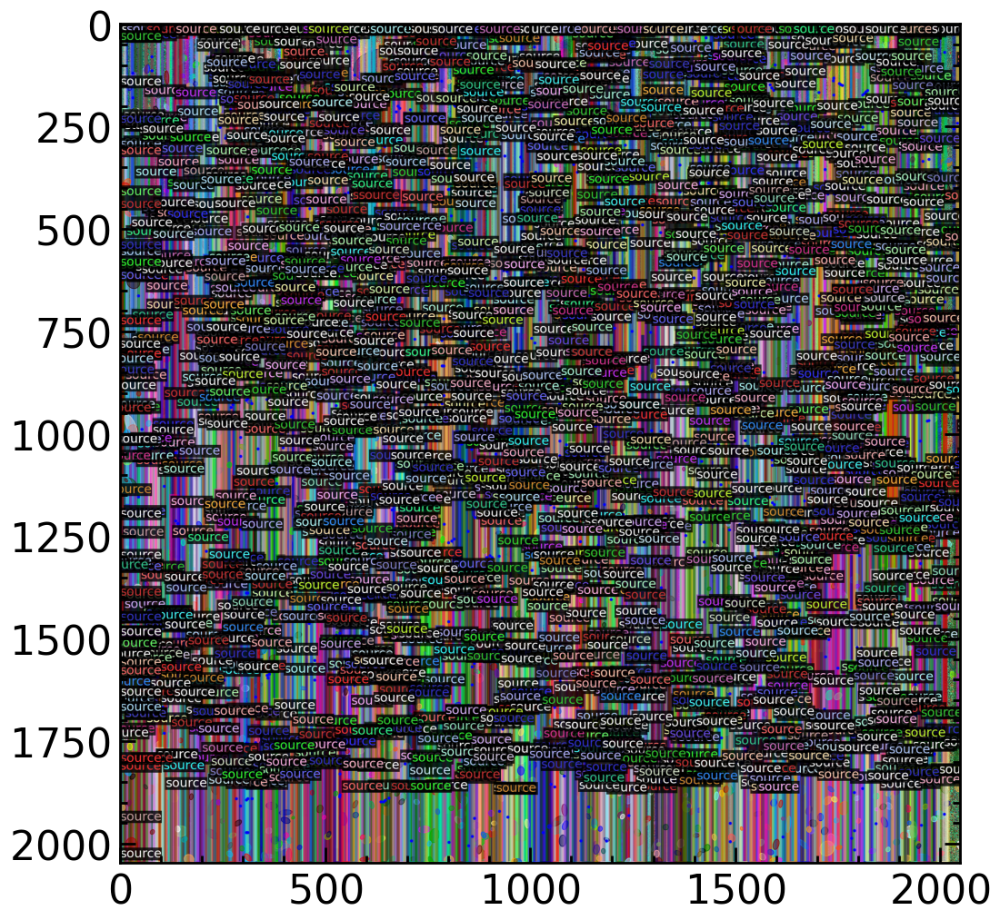

In [43]:
try: 
    DatasetCatalog.remove('slitless_spectra')
    MetadataCatalog.remove('slitless_spectra')
except:
    pass

register_coco_instances('slitless_spectra', {}, 'label.json', '.')

dataset_dicts = DatasetCatalog.get('slitless_spectra')
metadata = MetadataCatalog.get('slitless_spectra')

plt.figure(figsize=[6, 6])

for d in random.sample(dataset_dicts, 1):
    for a in d['annotations']:
        a.setdefault('segmentation', [])  # adds empty list if missing
    img = cv2.imread(d["file_name"])
    # print(img.shape)
    visualizer = Visualizer(img, metadata=metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    print(d["file_name"])
    plt.imshow(out.get_image()[:,:,::-1])

print(len(dataset_dicts))

plt.show()